In [1]:
import os
import matplotlib.pyplot as plt
import os
import pandas as pd
from amftrack.util.sys import get_analysis_folders,get_time_plate_info_from_analysis,get_time_hypha_info_from_analysis,get_global_hypha_info_from_analysis 
import numpy as np
import imageio
import os
import cv2
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
from amftrack.pipeline.final_analysis.density_wave import get_wave_fit, S, dS, wave, dwave
import matplotlib.patches as mpatches
from random import choice
import matplotlib as mpl
from amftrack.pipeline.final_analysis.density_wave import plot_single_plate
from amftrack.pipeline.final_analysis.hypha_speed_analysis import *

%matplotlib widget
plt.style.use('presentation.mplstyle')


c:\users\coren\documents\phd\code\amftrack\amftrack\util\dbx.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
all_analysis_folders = get_analysis_folders()


In [3]:
plates = [52,84,938,941,1076,94,152,102,76]
plates = [1076,94,52]
plates = [102, 152, 52, 56, 76, 792, 81, 83, 84, 877, 89, 91, 94,1076]
plates = [52,84,941,94,152,102,76,83]
# plates = ["127_20220705","129_20220711","130_20220707","1014_20220525","1023_20220502","1048_20220506", "1045_20220504","1035_20220518","1037_20220523","1042_20220523","1053_20220413"] #analysis C2

plates = [1014,130,1023,1048,1045,1053] #C2
plates = [792,1014,1042,127,130,1023,1045,1053,1048,52,84,938,1076,94,152,102,76,30,32,33,91] #C2
# plates = [30,32,33]
analysis_folders = all_analysis_folders.loc[all_analysis_folders['Plate'].isin(plates)]

In [4]:
folders,time_plate_info = get_time_plate_info_from_analysis(analysis_folders)
folders,global_hypha_info = get_global_hypha_info_from_analysis(analysis_folders)
folders, time_hypha_info = get_time_hypha_info_from_analysis(analysis_folders)

C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_44.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_45.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_46.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_47.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_54.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_55.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analysis_1045_20220504_189_Version1\time_hypha_info\hyph_info_56.json
C:\Users\coren\AMOLF-SHIMIZU Dropbox\DATA\PRINCE\1045_20220504\Analys

In [21]:
plates.remove(102)

C:\Users\coren\AppData\Local\Temp\ipykernel_9668\4066190351.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots()


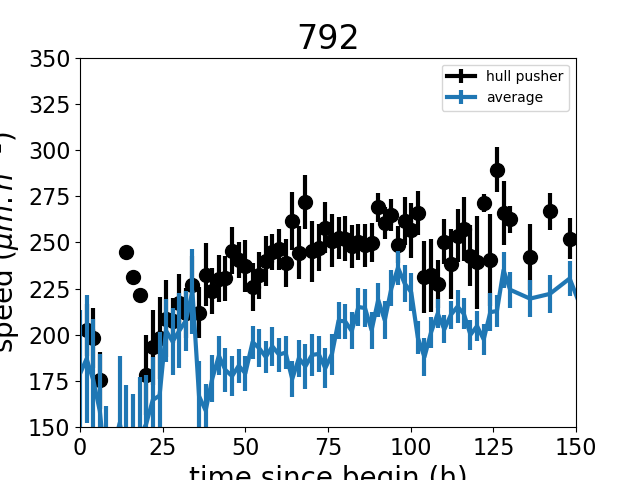

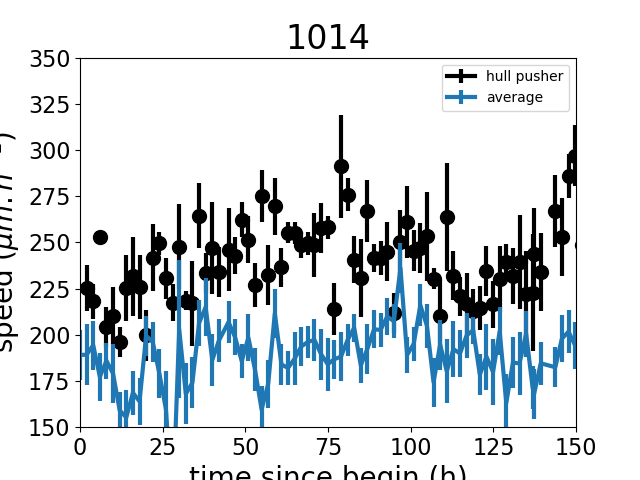

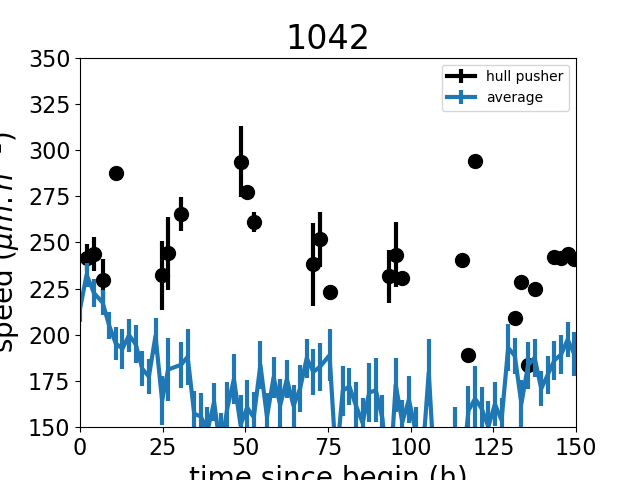

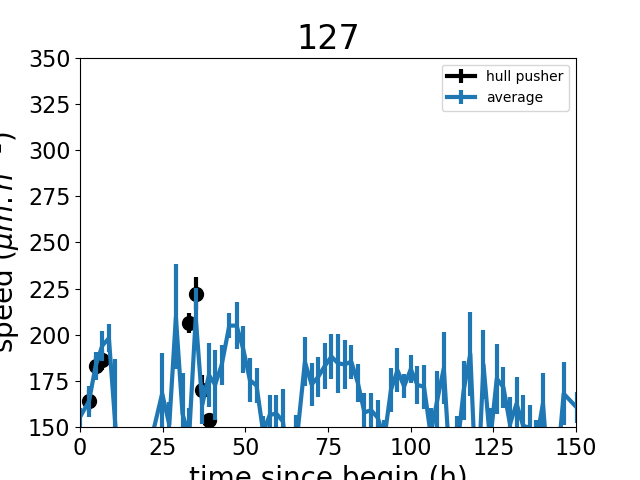

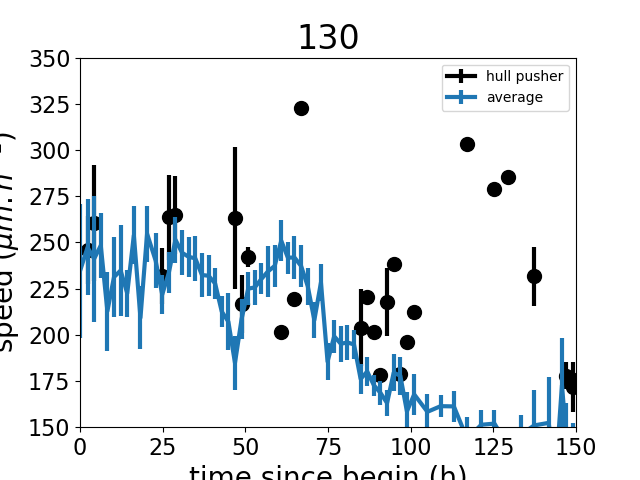

...

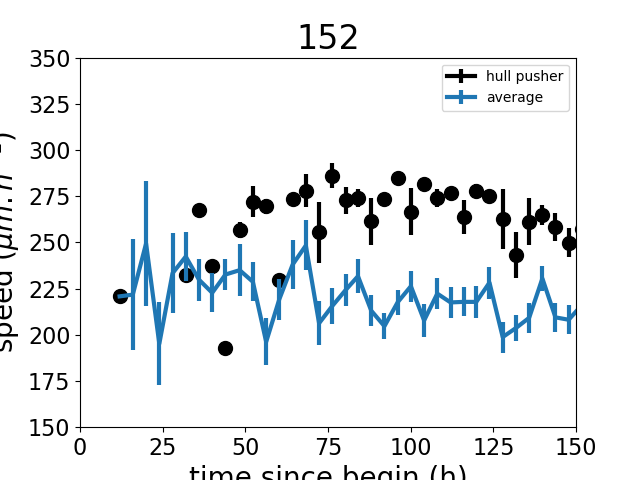

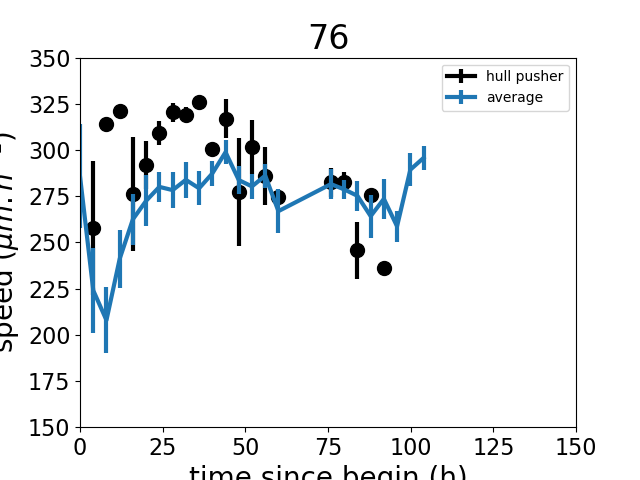

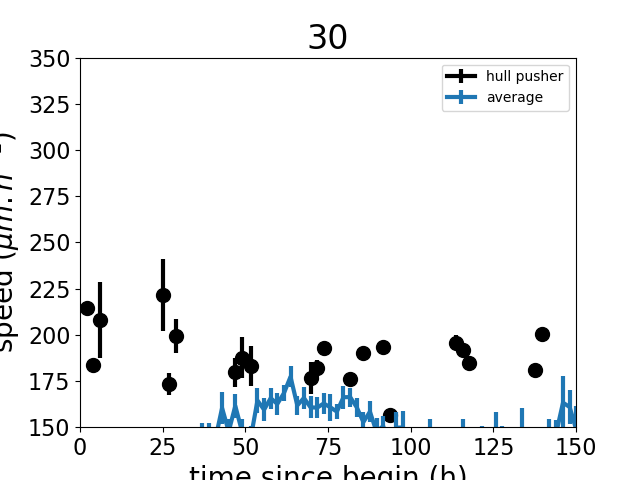

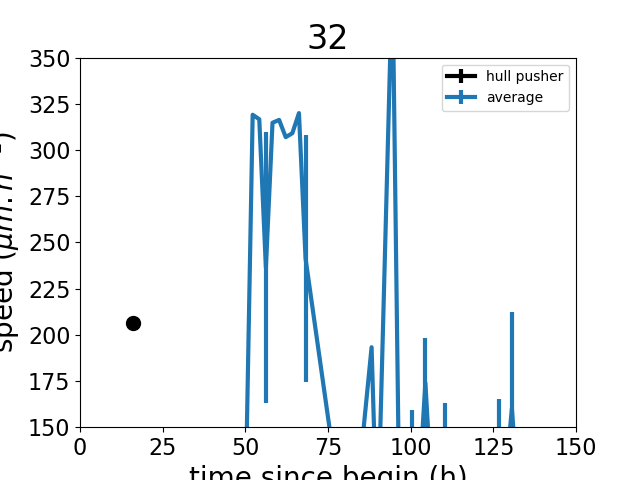

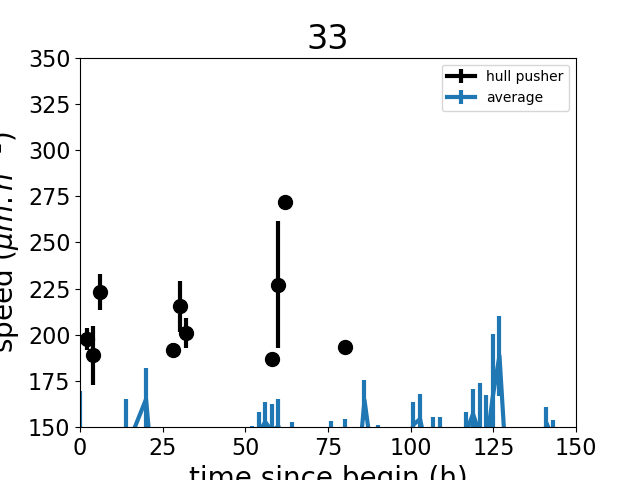

In [23]:
datas = {}
dys = {}
hull_speeds_dic = {}
hull_time_dic = {}

for plate in plates:
    hull_speeds = []
    hull_time = []
    time_hypha_plate = time_hypha_info.loc[time_hypha_info['unique_id'].astype(str).str[:len(str(plate))]==str(plate)]
    
    fig,ax = plt.subplots()
    data,dy,select_movements = get_average_time_data(plate,time_hypha_info,2)
    hyphae_hull = get_hyphae_hull(plate,analysis_folders)
    if len(hyphae_hull)>0:
        label = 'hull pusher'
        for t in range(1,len(time_hypha_plate['timestep'].unique())-1):
            select = time_hypha_plate.loc[time_hypha_plate['timestep']==t]
            select = select.loc[select['end'].isin(hyphae_hull[t-1]) |select['end'].isin(hyphae_hull[t]) |select['end'].isin(hyphae_hull[t+1])]
            select = select.loc[select['speed'].between(150,350)]
            if len(select)>0:
                ax.scatter(select['time_since_begin_h'].iloc[0]/pd.Timedelta(hours = 1),np.mean(select["speed"]),color='black')
                ax.errorbar(select['time_since_begin_h'].iloc[0]/pd.Timedelta(hours = 1),np.mean(select["speed"]),np.std(select["speed"])/np.sqrt(len(select)),color='black',label=label)
                label = None
                hull_speeds.append(np.mean(select["speed"]))
                hull_time.append(select['time_since_begin_h'].iloc[0]/pd.Timedelta(hours = 1))
                
            select = time_hypha_plate.loc[time_hypha_plate['timestep']==t]
            # select = select.loc[select['end'].isin(hyphae_hull[t-1]) |select['end'].isin(hyphae_hull[t]) |select['end'].isin(hyphae_hull[t+1])]
        # ax.plot(data.index/pd.Timedelta(hours = 1),data)
        ax.errorbar(data.index/pd.Timedelta(hours = 1),data, yerr=dy,label='average')
        ax.set_xlim(0,150)
        ax.set_ylim(150,350)
    datas[plate] = data
    dys[plate] = dy
    hull_speeds_dic[plate] = hull_speeds
    hull_time_dic[plate] = hull_time
    
    ax.legend()
    ax.set_title(f'{plate}')
    ax.set_xlabel('time since begin (h)')
    ax.set_ylabel('speed ($\mu m.h^{-1}$)')
    # break
    

In [24]:
cmap1 = mpl.cm.get_cmap('spring')
cmap2 = mpl.cm.get_cmap('winter')
Css = {}
lambss = {}
dss = {}
meancurves = {}
meancurves2 = {}
t0ss = {}
timestep = {32:100,28:60,30:80,1014: 80, 1023:60, 1037:70, 1042:100,52 : 65,56:50,938:30,1076:60,84:80,89:80,91:70,127:60,129:50,94:150,152:35,792:60,1048:60,1045:50,941:50}
timestep2 = {102:25,83:70,76:20,81:70,32:100,28:60,30:80,1014: 80, 1023:60, 1037:70, 1042:100,52 : 75,56:50,938:30,1076:60,84:80,89:80,91:70,127:60,129:50,94:100,152:35,792:50,1048:60,1045:50}
timestep = {**timestep, **timestep2}
timestep2 = {1014 : 80,1024:25,1027:18,1028:60,1030 : 60,1032 : 50,1042 : 120,1048:70,127:120,129:60,130:50,991:40}
timestep = {**timestep, **timestep2}
timestep2 = {1023 : 60,1031:30,1035:30,1037 : 80,1039 : 90,1045:70,1047:50,1053:40}
timestep = {**timestep, **timestep2}    

timestep2 = {1071 : 25,1076:70,839:60,938 : 35}
timestep = {**timestep, **timestep2}
timestep2 = {30 : 62,32 : 160,33:80}
timestep = {**timestep, **timestep2}

In [ ]:
plate

C:\Users\coren\anaconda3\envs\amftrack\lib\site-packages\pandas\core\arraylike.py:405: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\coren\anaconda3\envs\amftrack\lib\site-packages\pandas\core\arraylike.py:405: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\coren\anaconda3\envs\amftrack\lib\site-packages\pandas\core\arraylike.py:405: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\coren\anaconda3\envs\amftrack\lib\site-packages\pandas\core\arraylike.py:405: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\users\coren\documents\phd\code\amftrack\amftrack\pipeline\final_analysis\density_wave.py:37: RuntimeWarning: overflow encountered in exp
  return C * (1 / (1 + np.exp(lamb * (t0 - t))))


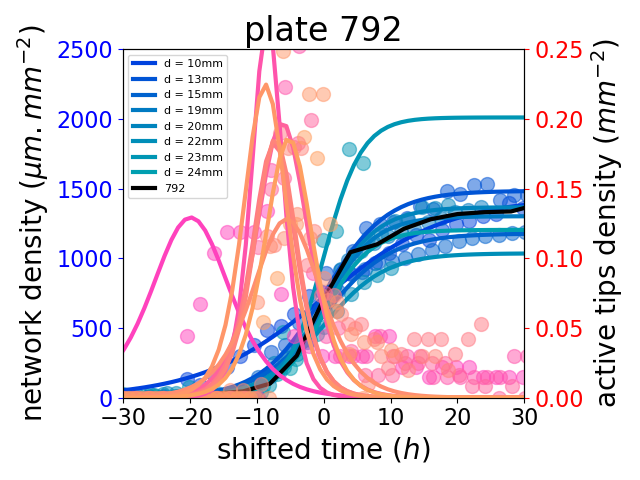

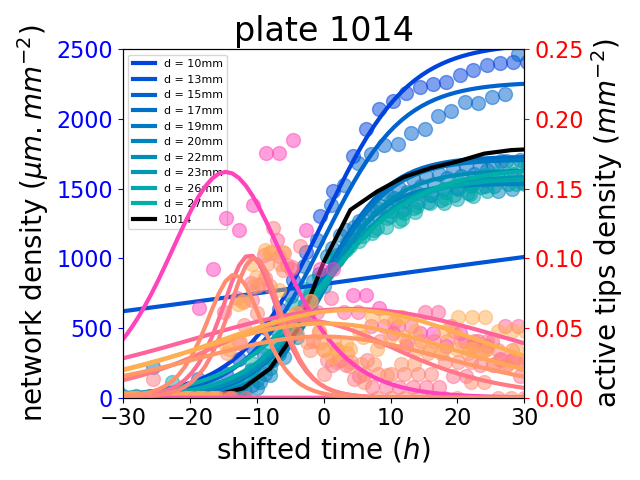

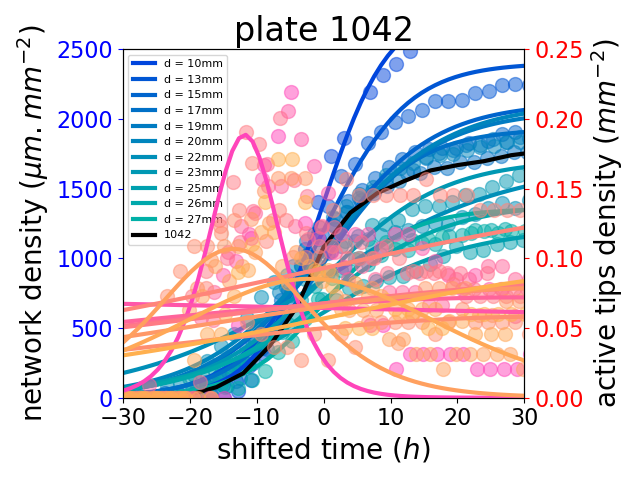

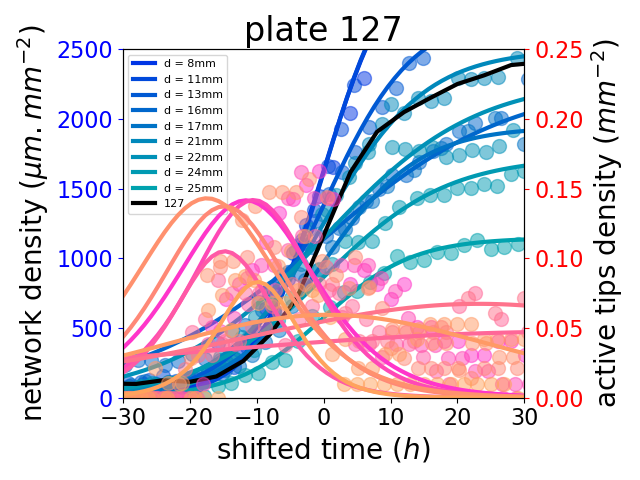

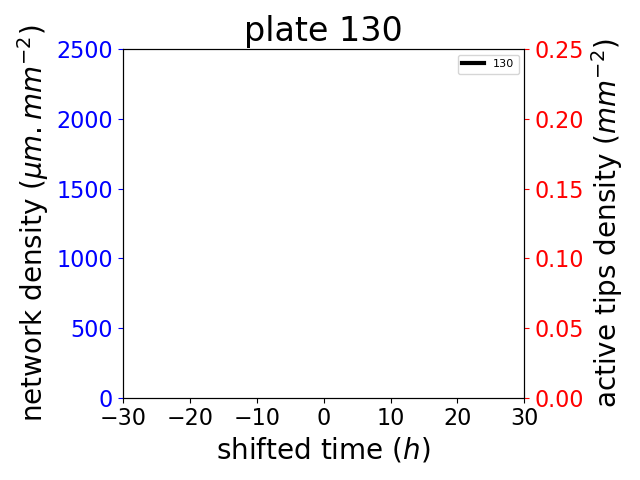

...

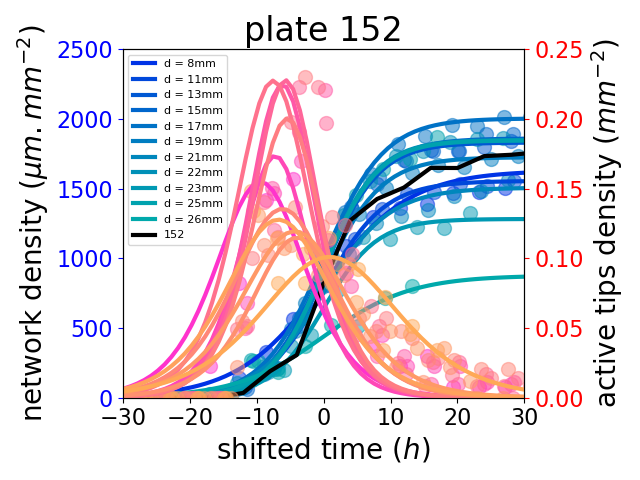

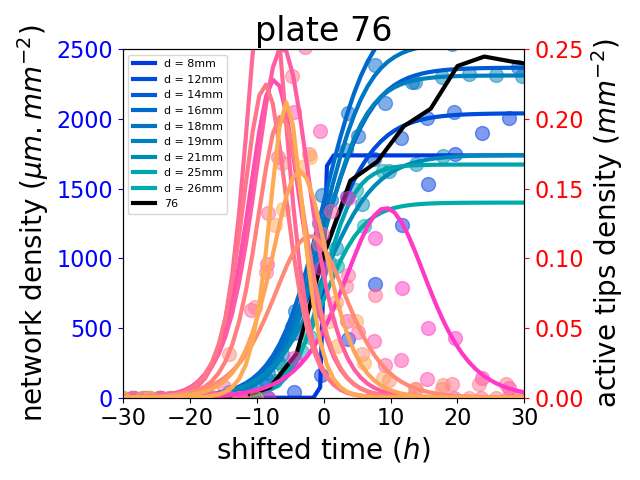

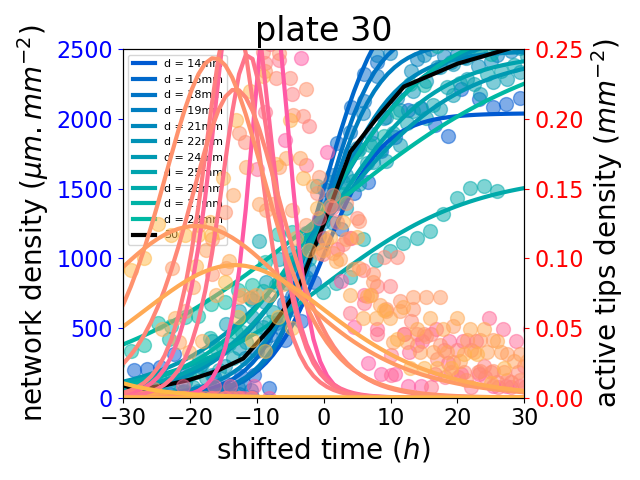

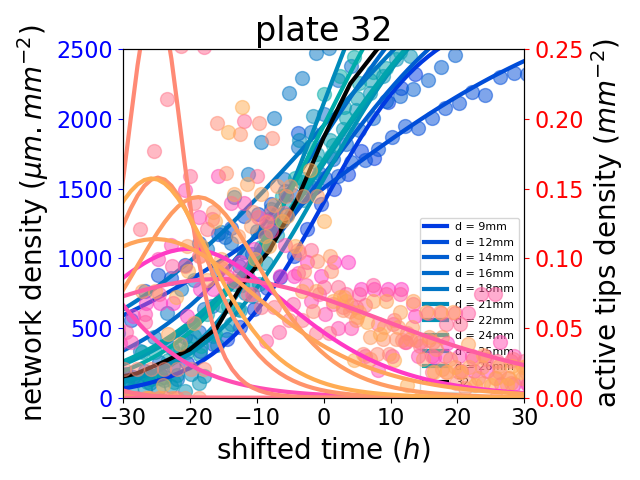

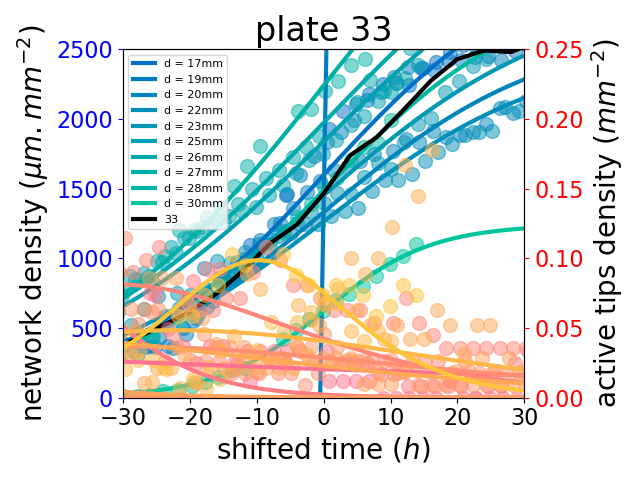

In [25]:
ncols = 3
maxis = {plate :12 for plate in plates}
for plate in plates:
    fig,ax = plt.subplots()
    Cs, lambs,ds,indexes, t0s,meancurve,meancurve2 = plot_single_plate(plate,time_plate_info,timestep[plate],ax,maxi =maxis[plate])
    meancurves[plate]=meancurve
    meancurves2[plate]=meancurve2
    Css[plate] = Cs
    lambss[plate] = lambs
    dss[plate] = ds
    t0ss[plate] = t0s

In [26]:
# fig, ax = plt.subplots()
treatments = set()
for plate in folders['Plate'].unique():
    if plate in meancurves.keys():
        strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
        medium = folders.loc[folders['Plate']==plate].iloc[0]['medium']
        treatment = strain+medium
        treatments.add(strain+medium)
colors = {"'A5''001P100N'" : 'orange',
 "'A5''001P100N100C'" : 'orange',
 "'A5''001P100N200C'" : 'red',
 "'A5''001P100N200C-T'" : 'red',
          
 "'A5sp3''001P100N100C'" :'orange',
 "'C2''001P100N100C'" : 'blue',
 "'C2''001P100N200C'" : 'purple',
"'Agg''001P100N100C'" : 'black',
"'Agg''001P100N200C'" : 'black'}     

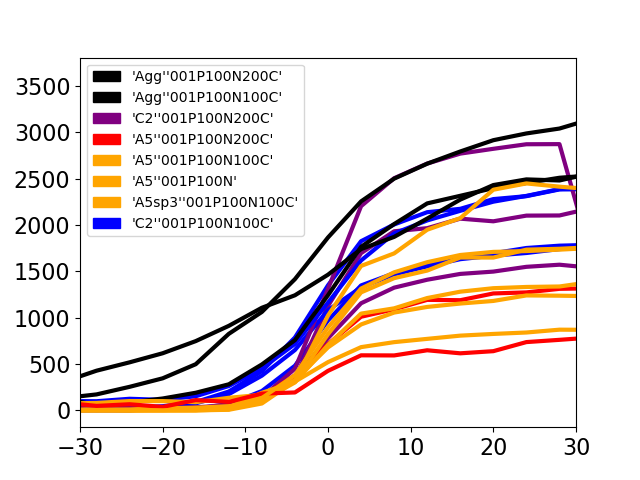

In [27]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots()

for plate in folders['Plate'].unique():
    if plate in meancurves.keys():
        strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
        medium = folders.loc[folders['Plate']==plate].iloc[0]['medium']
        treatment = strain+medium
        meancurve = meancurves[plate]
        ax.plot(meancurve.index,meancurve,label=plate,color = colors[treatment])
ax.set_xlim((-30,30))
patches = []
for treatment in treatments:
    patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
ax.legend(handles=patches)


'A5''001P100N100C'
'A5''001P100N200C'
'C2''001P100N100C'
'C2''001P100N200C'
'Agg''001P100N100C'


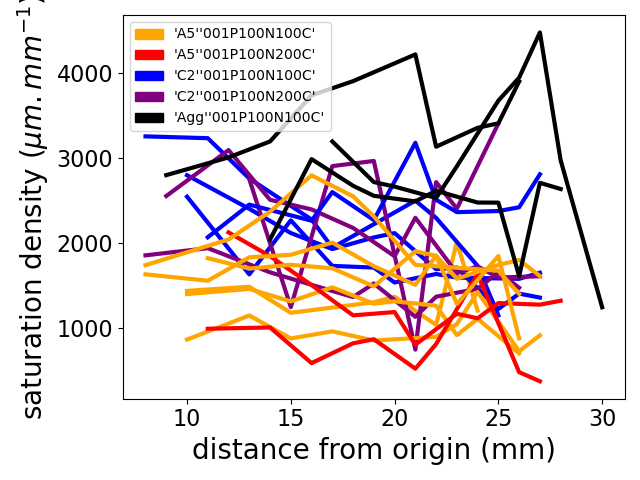

In [59]:
fig, ax = plt.subplots()
tot_ds = []
tot_Cs=[]
# plates = [52,152,94,102,83,84,792,76]
for plate in plates:
    Cs = Css[plate]
    ds = dss[plate]
    strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
    medium = folders.loc[folders['Plate']==plate].iloc[0]['medium']
    treatment = strain+medium
    tot_ds+=ds
    tot_Cs+=Cs
    ax.plot(ds,Cs,color=colors[treatment])
patches = []
for treatment in ["'A5''001P100N100C'","'A5''001P100N200C'","'C2''001P100N100C'","'C2''001P100N200C'","'Agg''001P100N100C'"]:
    print(treatment)
    patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
ax.legend(handles=patches)
ax.set_xlabel('distance from origin (mm)')
ax.set_ylabel('saturation density ($\mu m.mm^{-1}$)')
plt.tight_layout()


'A5''001P100N100C'
'A5''001P100N200C'
'C2''001P100N100C'
'C2''001P100N200C'
'Agg''001P100N100C'


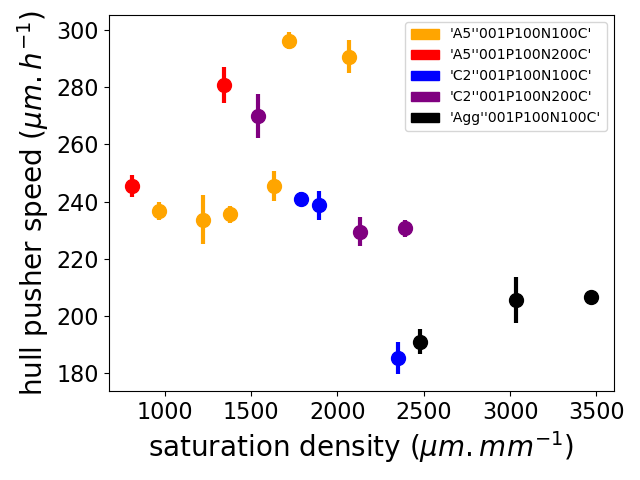

In [60]:
fig, ax = plt.subplots()
# plates.remove(102)
# plates.remove(76)

for plate in plates:
    Cs = Css[plate]
    hull_speed = hull_speeds_dic[plate]
    strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
    medium = folders.loc[folders['Plate']==plate].iloc[0]['medium']
    treatment = strain+medium
    ax.scatter(np.mean(Cs),np.mean(hull_speed),color=colors[treatment]) 
    ax.errorbar(np.mean(Cs),np.mean(hull_speed),np.std(hull_speed)/np.sqrt(len(hull_speed)),color=colors[treatment])    
    
# for treatment in treatments:
#     patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
# ax.legend(handles=patches)
ax.set_xlabel('saturation density ($\mu m .mm^{-1}$)')
ax.set_ylabel('hull pusher speed ($\mu m .h^{-1}$)'  ) 
patches = []
for treatment in ["'A5''001P100N100C'","'A5''001P100N200C'","'C2''001P100N100C'","'C2''001P100N200C'","'Agg''001P100N100C'"]:
    print(treatment)
    patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
ax.legend(handles=patches)

plt.tight_layout()

In [34]:
dico = {x : [] for x in [5,6,7]}

In [36]:
dico[5].append(8)
dico

{5: [8, 8], 6: [], 7: []}

In [47]:
values_density

{"'C2'": [1787.1879141514958,
  1891.9702037345296,
  2348.7211859371487,
  nan,
  2130.770265421011,
  1539.2271144042336,
  2392.121563796728,
  2482.1676583123117],
 "'A5'": [1377.4969446606283,
  969.6725998008172,
  808.297468043919,
  1343.4341670900708,
  1721.2635532018364,
  1633.7537856372858,
  2069.1034531277933],
 "'Agg'": [2478.419163592581, 3465.9833035613547, 3032.0385193838306],
 "'A5sp3'": [1222.9397373668237]}

'C2'
'A5'
'Agg'


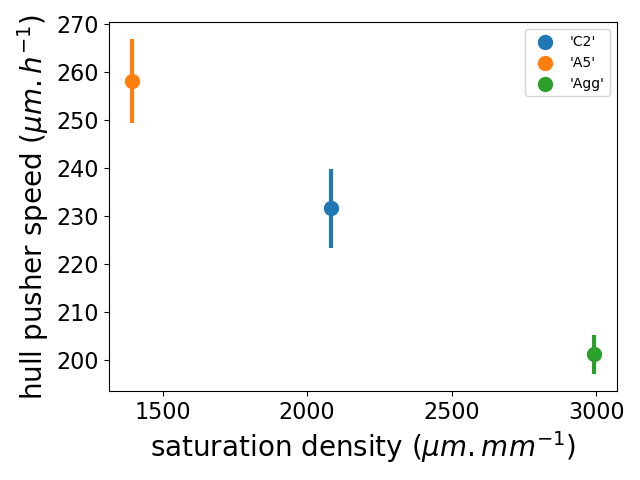

In [56]:
fig, ax = plt.subplots()
# plates.remove(102)
# plates.remove(76)
values_speed = {strain : [] for strain in folders['strain'].unique()}
values_density = {strain : [] for strain in folders['strain'].unique()}
for plate in plates:
    Cs = Css[plate]
    hull_speed = hull_speeds_dic[plate]
    strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
    values_speed[strain].append(np.mean(hull_speed))
    values_density[strain].append(np.mean(Cs))
    
values_density["'A5'"] += values_density["'A5sp3'"]
values_speed["'A5'"] += values_speed["'A5sp3'"]
strains = list(values_speed.keys())
strains.remove("'A5sp3'")
for strain in strains:
    print(strain)
    ax.scatter(np.nanmean(values_density[strain]),np.nanmean(values_speed[strain]),label = strain) 
    ax.errorbar(np.nanmean(values_density[strain]),np.nanmean(values_speed[strain]),np.nanstd(values_speed[strain])/np.sqrt(len(values_speed[strain])))    
    
# for treatment in treatments:
#     patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
# ax.legend(handles=patches)
ax.set_xlabel('saturation density ($\mu m .mm^{-1}$)')
ax.set_ylabel('hull pusher speed ($\mu m .h^{-1}$)'  ) 
plt.legend()
plt.tight_layout()

'A5''001P100N100C'
'C2''001P100N100C'
'C2''001P100N200C'
'A5''001P100N200C'


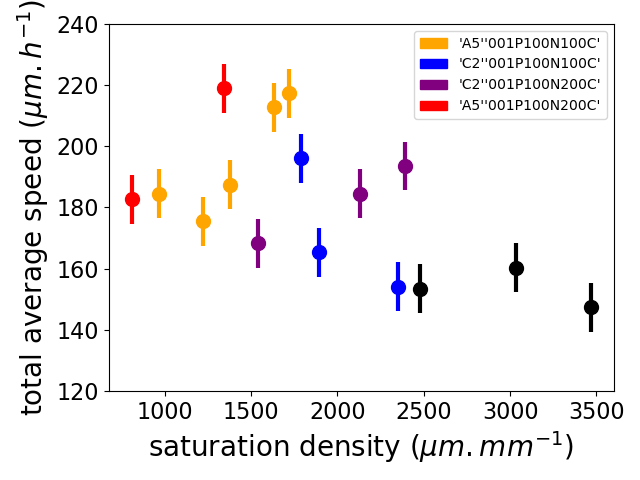

In [33]:
fig, ax = plt.subplots()
for plate in plates:
    Cs = Css[plate]
    mean_speed = datas[plate]
    strain = folders.loc[folders['Plate']==plate].iloc[0]['strain']
    medium = folders.loc[folders['Plate']==plate].iloc[0]['medium']
    treatment = strain+medium
    ax.scatter(np.mean(Cs),np.mean(mean_speed),color=colors[treatment]) 
    ax.errorbar(np.mean(Cs),np.mean(mean_speed),np.std(hull_speed)/np.sqrt(len(hull_speed)),color=colors[treatment])    
    
ax.set_xlabel('saturation density ($\mu m .mm^{-1}$)')
ax.set_ylabel('total average speed ($\mu m .h^{-1}$)'  ) 
patches = []
for treatment in ["'A5''001P100N100C'","'C2''001P100N100C'","'C2''001P100N200C'","'A5''001P100N200C'"]:
    print(treatment)
    patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
ax.legend(handles=patches)
ax.set_ylim(120,240)
plt.tight_layout()

In [ ]:
treatments
patches = []
for treatment in treatments:
    print(treatment)
    patches.append(mpatches.Patch(color=colors[treatment], label=treatment))
ax.legend(handles=patches)

In [ ]:
import imageio
imageio.imread(